In [17]:
## imports 
import pandas as pd
import numpy as np
from wrangle import *
from model import *
import matplotlib.pyplot as plt
import datetime as dt
import time

# modeling methods

alpha=0.05 #alpha for stats


import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [18]:

prepped=prep_zillow_2017()


our sql grab:
 (56080, 16)
df.transactiondate.min():
2017-01-01 00:00:00

df.transactiondate.max():
2017-09-21 00:00:00
Number of observations removed: 7851
Number of observations removed: 1772
This is our percent change after removing all the outliers and merging :
 -25.77%
mean kurt:
-0.24314158712936862
final shape:
(41629, 29)


None

,id
county,
LA,70.70%
Orange,29.30%


In the prepare step we needed to deal with some outliers. In order to preserve the integrity of the data we seperated by the county, delt with outliers respective to each county then merged the data back together.

### Data Dictionary







|Name|                                    Dtype|
|-------------|-------------|
|area|                                    float64|
|assessmentyear|                          float64|
|bathdividesarea|                         float64|
|bathdividesbed|                          float64|
|bathplusbathdividesarea|                 float64|
|bathroomcnt|                             float64|
|bed|+bath*area                           float64|
|bedbath_harmean|*area                    float64|
|beddivdesbath|                           float64|
|bedroomcnt|                              float64|
|calculatedbathnbr|                       float64|
|county|                                   object|
|decade|                                    int64|
|fips|                                      int64|
|fullbathcnt|                             float64|
|id|                                        int64|
|latitude|                                float64|
|logerror|                                float64|
|longitude|                               float64|
|lotsizesquarefeet|                       float64|
|lotsizesquarefeet_wo_outliers|           float64|
|roomcnt|                                 float64|
|sqrt(bed^2+bath^2)*area|                 float64|
|taxvaluedollarcnt|                       float64|
|transaction_month|                        object|
|transaction_month_int|                     int64|
|transactiondate|                  datetime64[ns]|
|transactiondate_in_days|                   int64|
|yearbuilt|                               float64|

In [19]:
X_train, y_train, X_validate, y_validate, X_test, y_test, X_la_train, y_la_train, X_la_validate, y_la_validate, X_la_test, y_la_test,X_orange_train, y_orange_train, X_orange_validate, y_orange_validate, X_orange_test, y_orange_test,train,train_la,orange_train=single_split_many_return(prepped)


Note: The Train, Validate, Test split happens only once. This is in order to maintain data integrity.


In [20]:
h,w,aspect,h_int=goldenvisvars(m=1.75) 
#For viz purposes only

Questions:

Generally I am interested in if time or location is significant to consider in this data. The specific questions we ask aboout this are asked in line.

In [21]:

fig = px.scatter_mapbox(train_la, lat=train_la.latitude/1e6, lon=train_la.longitude/1e6,center={'lat':34.0412,'lon':-118.251},hover_data=['yearbuilt','county'],color='transaction_month', zoom=8.25 ,height=h*1e2,width=w*1e2,size_max=1,opacity=.45)
fig.update_layout(mapbox_style='carto-darkmatter',title="Transactions by Month in (LA) 2017")
fig.show()

fig = px.scatter_mapbox(orange_train, lat=orange_train.latitude/1e6, lon=orange_train.longitude/1e6,center={'lat':33.76267,'lon':-117.8781},hover_data=['yearbuilt','county'],color='transaction_month', zoom=9, height=h*1e2,width=w*1e2,size_max=1,opacity=.45)
fig.update_layout(mapbox_style='carto-darkmatter',title="Transactions by Month in (OC) 2017")
fig.show()




We want to know if there are significant differences in the property values between LA and Orange. Lets findout:
 
 
 
1.
 
$ H_0 $ : The average property value in LA is the same as in Orange
 
Verify Assumptions
 
Independent Samples (n.a. for 1-sample t-test). YES! no observations in the LA sample exist in the Orange.
Normal Distribution, or at least 30 observations and "kinda" normal. The more observations you have, the less "normal" it needs to appear. (CLT). YES! Plenty of observations
Equal Variances: They are not equal so we will account for that.
 



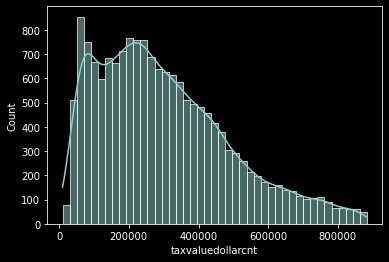

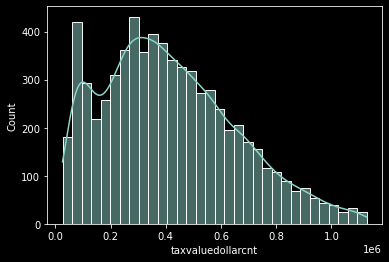

varsdiff:
2.2e+10


Reject~H_{0}~?

True

In [22]:
sns.histplot(data=train_la,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=orange_train,x='taxvaluedollarcnt',kde=True)
plt.show()




train_LA = train[train['county'] == 'LA']
varLA=train_LA.taxvaluedollarcnt.var()


train_Orange = train[train['county'] == 'Orange']

varOrange=train_Orange.taxvaluedollarcnt.var()
varsdiff=abs(varOrange-varLA)
print(f'varsdiff:\n{varsdiff:.2g}')
t,p = stats.ttest_ind(train_LA.taxvaluedollarcnt, train_Orange.taxvaluedollarcnt,equal_var=False)
rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)


# train.columns

Since we can reject our null hypthesis we can say that the data varies significatly by location



2.
Do the top three most profitable transaction months have significant differences?

$ H_0 $ : The top three most profitable transaction months have the same mean.

Verify Assumptions

Independent Samples (n.a. for 1-sample t-test). YES! no observations These are three separate months.
Normal Distribution, or at least 30 observations and "kinda" normal. The more observations you have, the less "normal" it needs to appear. (CLT). YES! Plenty of observations
Equal Variances: They are not equal so we will account for that.





,taxvaluedollarcnt
transaction_month,
August,4.4e+10
July,4.95e+10
May,4.16e+10


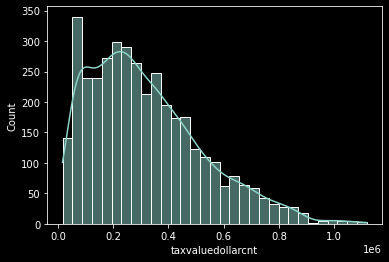

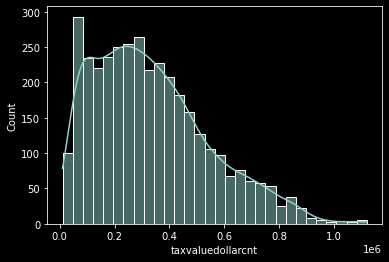

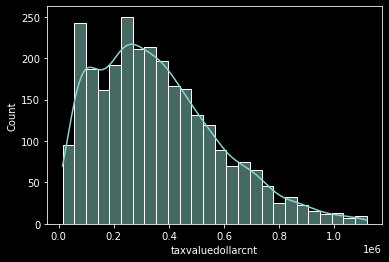

Reject~H_{0}~?

True

In [23]:

topthreesalesvalue=train[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalescount=train[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).count().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvaluedf=train[(train.transaction_month==topthreesalesvalue[0]) | (train.transaction_month==topthreesalesvalue[1]) | (train.transaction_month==topthreesalesvalue[2]) ]
display(topthreesalesvaluedf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months\n by total value"))


trainjune=train[(train.transaction_month==topthreesalesvalue[0])]
trainmarch=train[(train.transaction_month==topthreesalesvalue[1])]
trainmay=train[(train.transaction_month==topthreesalesvalue[2])]


sns.histplot(data=trainjune,x='taxvaluedollarcnt',kde=True)
plt.show()

sns.histplot(data=trainmarch,x='taxvaluedollarcnt',kde=True)
plt.show()

sns.histplot(data=trainmay,x='taxvaluedollarcnt',kde=True)
plt.show()


h,p=stats.kruskal(trainjune.taxvaluedollarcnt, trainmarch.taxvaluedollarcnt, trainmay.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)

Since we reject the null hypothesis, we say that the differences three most profitable months are statistically significant i.e they are not distribuited the same.

3.
Do the top three most profitable transaction months for (LA count) have significant differences?
 
 
$ H_0 $ : The top three most profitable transaction months have the same mean.



,taxvaluedollarcnt
transaction_month,
August,3.79e+10
June,3.56e+10
May,3.51e+10


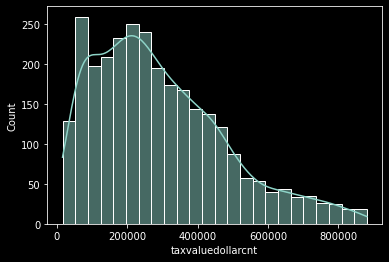

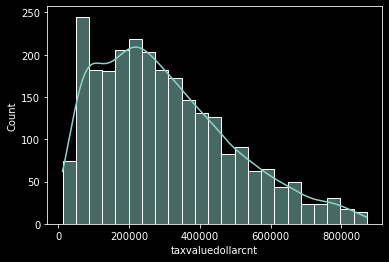

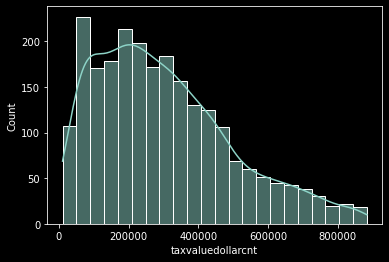

Reject~H_{0}~?

False

In [24]:

topthreesalesvalue_la=train_LA[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvalue_ladf=train_LA[(train_LA.transaction_month==topthreesalesvalue_la[0]) | (train_LA.transaction_month==topthreesalesvalue_la[1]) | (train_LA.transaction_month==topthreesalesvalue_la[2]) ]
display(topthreesalesvalue_ladf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months(LA)\n by total value"))


train_LAjune=train_LA[(train_LA.transaction_month==topthreesalesvalue_la[0])]
train_LAmarch=train_LA[(train_LA.transaction_month==topthreesalesvalue_la[1])]
train_LAmay=train_LA[(train_LA.transaction_month==topthreesalesvalue_la[2])]

sns.histplot(data=train_LAjune,x='taxvaluedollarcnt',kde=True)
plt.show()


sns.histplot(data=train_LAmarch,x='taxvaluedollarcnt',kde=True)
plt.show()


sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()

h,p=stats.kruskal(train_LAjune.taxvaluedollarcnt, train_LAmarch.taxvaluedollarcnt, train_LAmay.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)


Since we can't reject the null hypothesis, we say that the differences three most profitable months are statistically insignificant. i.e They are the same distributions.



4.
Do the top three most profitable transaction months for (Orange County) have significant differences?


$ H_0 $ : The top three most profitable transaction months have the same mean.



,taxvaluedollarcnt
transaction_month,
April,5.55e+10
February,5.29e+10
July,5.94e+10


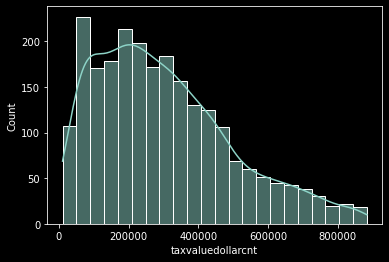

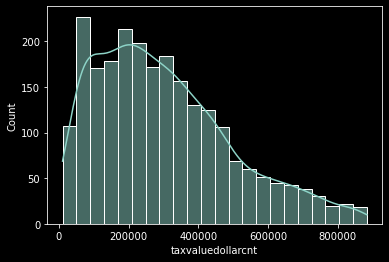

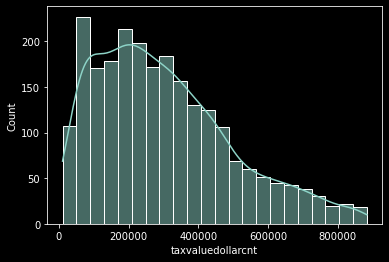

Reject~H_{0}~?

False

In [25]:

topthreesalesvalue_orange=train_Orange [['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvalue_orangedf=train_Orange [(train_Orange .transaction_month==topthreesalesvalue_orange[0]) | (train_Orange .transaction_month==topthreesalesvalue_orange[1]) | (train_Orange .transaction_month==topthreesalesvalue_orange[2]) ]
display(topthreesalesvalue_orangedf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months (OC)\n by total value"))


train_Orange_june=train_Orange [(train_Orange .transaction_month==topthreesalesvalue_orange[0])]
train_Orange_march=train_Orange [(train_Orange .transaction_month==topthreesalesvalue_orange[1])]
train_Orange_may=train_Orange [(train_Orange .transaction_month==topthreesalesvalue_orange[2])]

sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()

h,p=stats.kruskal(train_Orange_june.taxvaluedollarcnt, train_Orange_march.taxvaluedollarcnt, train_Orange_may.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)



Since we can't reject the null hypothesis, we say that the differences three most profitable months are statistically insignificant. i.e They are the same distributions.

In the following step we simply reduce the prepped data and split data into a minimal product to put into our model

In [26]:
mvp={'bathroomcnt','bedroomcnt','area'}

X_train,X_validate,X_test,X_la_train,X_la_validate,X_la_test,X_orange_train,X_orange_validate,X_orange_test=mvpModels(X_train,X_validate,X_test,X_la_train,X_la_validate,X_la_test,X_orange_train,X_orange_validate,X_orange_test,mvp)

After the split we consider our baseline metrics comparing mean median and mode, we will use Root Mean Square Error(RMSE) as our metric to compare model performance.
 
Note: Root Mean Square Error is an absolute measure of the goodness for the fit with the same units as the data.
 
 
We also create two lists which will eventually be zipped together and create a dataframe to compare the models. The model with the least absolute difference from train to verify will be considered our best model and that model will be the only model we attempt to further optimize via grid search.This optimized model will be the only model we test on.
 
 
The only displayed dataframe is sorted by the lowest absolute difference of RMSE


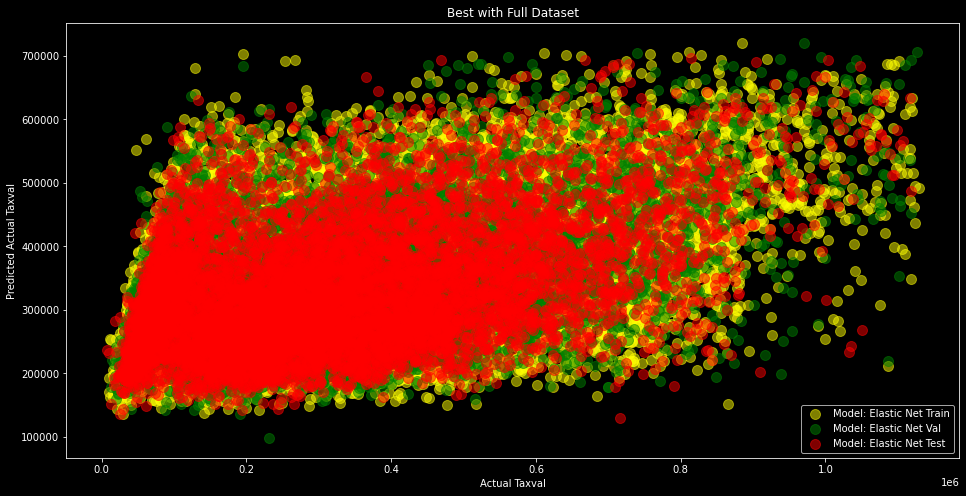

,Train,Validate,diff,abs_diff
RMSE for Elastic Net Model,1.88e+05,1.89e+05,-487,487
BayesianRidge,1.88e+05,1.88e+05,-599,599
RMSE for ARDRegression,1.88e+05,1.88e+05,-600,600
RMSE for Lasso + Lars,1.88e+05,1.88e+05,-600,600
RMSE for OLM,1.88e+05,1.88e+05,-602,602
RMSE for LassoLarsIC,1.88e+05,1.88e+05,-602,602
"RMSE for Tweedie, power=0 & alpha=0",1.88e+05,1.88e+05,-602,602
RMSE for degree3 Polynomial Model,1.87e+05,1.88e+05,-636,636
RMSE for 2nd Degree Polynomial Model,1.87e+05,1.88e+05,-637,637
RMSE using Mean,2.12e+05,2.13e+05,-737,737


,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
Elastic Net,1.881e+05,1.886e+05,1.882e+05,-4.871e+02,4.871e+02,-7.873e+01,7.873e+01


In [27]:
rmseDF_full=regmodelbest(X_train, y_train, X_validate, y_validate, X_test, y_test)
fulltest,disp=fullTest(X_train, y_train, X_validate, y_validate, X_test, y_test)
display(rmseDF_full.style.highlight_min(subset='abs_diff').format(lambda x:f'{x:.3g}').set_caption(caption="Full Prepped Dataset"),fulltest.style.highlight_min(subset='Train_to_Test_abs_diff').format(lambda x:f'{x:.3e}').set_caption(caption=" BestModel  Full Prepped Dataset"))


In [28]:
##LA

rmseDF_la=regmodelbest(X_la_train, y_la_train, X_la_validate, y_la_validate, X_la_test, y_la_test)
laTest=laTestregmodelbest(X_la_train, y_la_train, X_la_validate, y_la_validate, X_la_test, y_la_test)
display(rmseDF_la.style.highlight_min(subset='abs_diff').format(lambda x:f'{x:.3e}').set_caption(caption="LA Portion of Prepped Dataset"),laTest.style.format(lambda x:f'{x:.3e}').set_caption(caption="LA Test"))

,Train,Validate,diff,abs_diff
RMSE using Mean,1.894e+05,1.897e+05,-2.534e+02,2.534e+02
"RMSE for Tweedie, power=1.5 & alpha=0",1.894e+05,1.897e+05,-2.534e+02,2.534e+02
"RMSE for Tweedie, power=1 & alpha=0",1.894e+05,1.897e+05,-2.534e+02,2.534e+02
RMSE for Elastic Net Model,1.756e+05,1.759e+05,-2.661e+02,2.661e+02
BayesianRidge,1.753e+05,1.757e+05,-3.555e+02,3.555e+02
RMSE for ARDRegression,1.753e+05,1.757e+05,-3.575e+02,3.575e+02
RMSE for Lasso + Lars,1.753e+05,1.757e+05,-3.603e+02,3.603e+02
"RMSE for Tweedie, power=0 & alpha=0",1.753e+05,1.757e+05,-3.611e+02,3.611e+02
RMSE for OLM,1.753e+05,1.757e+05,-3.611e+02,3.611e+02
RMSE for LassoLarsIC,1.753e+05,1.757e+05,-3.611e+02,3.611e+02


,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
"TweedieRegressor (power=1.5, alpha=0.25)",1.894e+05,1.897e+05,1.923e+05,-2.534e+02,2.534e+02,-2.894e+03,2.894e+03


In [29]:
##Orange

rmseDF_orange=regmodelbest(X_orange_train, y_orange_train, X_orange_validate, y_orange_validate, X_orange_test, y_orange_test)
otest=orangeTest(X_orange_train, y_orange_train, X_orange_validate, y_orange_validate, X_orange_test, y_orange_test)
display(rmseDF_orange.style.highlight_min(subset='abs_diff').format(lambda x:f'{x:.3e}').set_caption(caption="Orange County Portion of Prepped Dataset"),otest.style.format(lambda x:f'{x:.3e}').set_caption(caption="Orange County Test"))



,Train,Validate,diff,abs_diff
RMSE for Elastic Net Model,2.079e+05,2.108e+05,-2.953e+03,2.953e+03
RMSE for degree3 Polynomial Model,2.061e+05,2.091e+05,-2.996e+03,2.996e+03
RMSE for 2nd Degree Polynomial Model,2.064e+05,2.095e+05,-3.110e+03,3.110e+03
BayesianRidge,2.068e+05,2.100e+05,-3.190e+03,3.190e+03
RMSE for ARDRegression,2.068e+05,2.100e+05,-3.194e+03,3.194e+03
RMSE for Lasso + Lars,2.068e+05,2.100e+05,-3.196e+03,3.196e+03
RMSE for OLM,2.068e+05,2.100e+05,-3.197e+03,3.197e+03
RMSE for LassoLarsIC,2.068e+05,2.100e+05,-3.197e+03,3.197e+03
"RMSE for Tweedie, power=0 & alpha=0",2.068e+05,2.100e+05,-3.197e+03,3.197e+03
RMSE for degree4 Polynomial Model,2.058e+05,2.092e+05,-3.453e+03,3.453e+03


,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
RMSE for Elastic Net Model,2.079e+05,2.108e+05,2.033e+05,-2.953e+03,2.953e+03,4.552e+03,4.552e+03


Note: all the RSME's are the same order of magnitude $x \cdot 10^5$ We also had several models that beat our respective baseline metrics. This is good if we wish to optimize further in the future. Also we see that the Elastic Net model performed well in each iteration.


Conclusion:
Magie can rest easy:
Our data all comes from LA or Orange county in California.
Used FIPS to find the county’s and states.
 
 
 
Our selected top models all beat or matched baseline. It is worth further exploring hyperparameters and the partitioned data. Also to note there are model selection criteria we could have used. As such it would be worth investigating Mean Absolute Error(MAE) and $ R^2 $ as model selection criteria. Perhaps one model would perform well in each and might be a better general model.
 
Note: There are models that generalize well to all the data and currently the combined data model has better performance than the separated. I think this warrants further investigation as shown by the statistical inquires and simply that our data is roughly 3/4 from LA and 1/4 from OC. Ultimately we would wish to generalize this proves and find the optimal scale : state, county
,zip, zones based on a measure of central tendency and population density etc. Since we have geodata this is all possible but will take detailed and creative exploratory analysis.
